Import `Resources/haunted_places.csv` into a database named `nw-project-3` and a collection named `haunted-places` and then run the code below

In [2]:
# Imports
from pymongo import MongoClient
from pprint import pprint
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re

In [13]:
# Create instance of MongoClient
client = MongoClient(port=27017)

# List databases
print(client.list_database_names())

['admin', 'config', 'local', 'nw_project_3', 'uk_food']


In [14]:
# assign nw-project-3 database to db and list the collection names
db = client['nw_project_3']
print(db.list_collection_names())
haunted_places = db['haunted_places']

['haunted_places']


In [15]:
# print out an entry from haunted_places
pprint(haunted_places.find_one())

{'_id': ObjectId('65307a1164b05a0388495e4e'),
 'city': 'Ada',
 'city_latitude': 42.960727,
 'city_longitude': -85.4954803,
 'country': 'United States',
 'description': 'Ada witch - Sometimes you can see a misty blue figure '
                'floating within a 3-mile radius of the Ada Cemetery on 2 Mile '
                'between Egypt Valley and Honey Creek. The story of her origin '
                'is as follows: A man suspected his wife of having an affair, '
                'so he followed her late one night when she thought he was '
                'asleep. Sure enough, she went to a field near their property '
                'where she met her lover. The husband was enraged and killed '
                'his wife, which resulted in a struggle with the other man. '
                'Both men died from their injuries. It is said that late at '
                'night (especially during the night of and the nights '
                'preceding a full moon) people driving by the field c

In [16]:
# get top 10 most haunted states
group_query = {"$group": {"_id": "$state", "count": {"$sum": 1}}}
sort_query = {"$sort": {"count": -1}}
pipeline_query = [group_query, sort_query]
pipeline_res = list(haunted_places.aggregate(pipeline=pipeline_query))

for res in pipeline_res:
    print(res)

{'_id': 'California', 'count': 1070}
{'_id': 'Texas', 'count': 696}
{'_id': 'Pennsylvania', 'count': 649}
{'_id': 'Michigan', 'count': 529}
{'_id': 'Ohio', 'count': 477}
{'_id': 'New York', 'count': 459}
{'_id': 'Illinois', 'count': 395}
{'_id': 'Kentucky', 'count': 370}
{'_id': 'Indiana', 'count': 351}
{'_id': 'Massachusetts', 'count': 342}
{'_id': 'Florida', 'count': 328}
{'_id': 'Missouri', 'count': 314}
{'_id': 'Georgia', 'count': 289}
{'_id': 'Wisconsin', 'count': 274}
{'_id': 'Alabama', 'count': 224}
{'_id': 'Tennessee', 'count': 221}
{'_id': 'Washington', 'count': 218}
{'_id': 'North Carolina', 'count': 211}
{'_id': 'Oklahoma', 'count': 211}
{'_id': 'New Jersey', 'count': 194}
{'_id': 'Virginia', 'count': 192}
{'_id': 'Connecticut', 'count': 185}
{'_id': 'Maryland', 'count': 170}
{'_id': 'Iowa', 'count': 169}
{'_id': 'South Carolina', 'count': 168}
{'_id': 'Colorado', 'count': 166}
{'_id': 'Minnesota', 'count': 162}
{'_id': 'Arizona', 'count': 156}
{'_id': 'Oregon', 'count': 155

In [17]:
# make pandas dataframe using pipeline results
top_10_state = pd.DataFrame(pipeline_res[:10])
top_10_state.rename({"_id": "state"}, axis=1, inplace=True)
top_10_state.head()

,state,count
0,California,1070
1,Texas,696
2,Pennsylvania,649
3,Michigan,529
4,Ohio,477


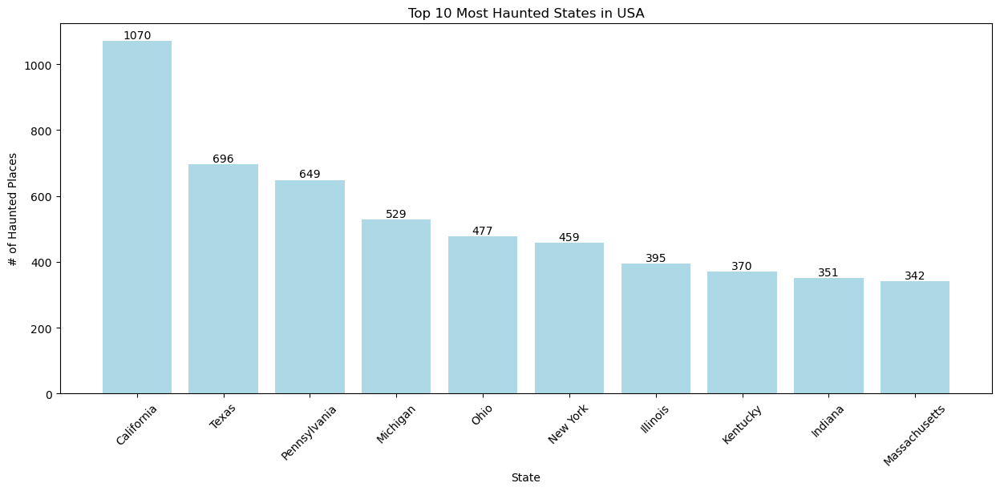

In [18]:
# make the bar graph
plt.figure(figsize=(15, 6))
bars = plt.bar(top_10_state['state'], top_10_state['count'], color = 'lightblue')

# Add data labels on top of each bar
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(height), ha='center', va='bottom')

plt.xlabel('State')
plt.ylabel('# of Haunted Places')
plt.title('Top 10 Most Haunted States in USA')
plt.xticks(rotation=45)
plt.show()

In [19]:
chosenState = "Michigan"
query = {"state": chosenState}
filter = {"_id": 0, "description": 0, "country": 0, "state_abbrev": 0}

state_res = list(haunted_places.find(query, filter))

In [20]:
# make dataframe and then use Joel's code to get the x and y values for this bar graph
haunted_state = pd.DataFrame(state_res)
haunted_state['place'] = haunted_state['location'].str.extract(r'([a-zA-Z]+)\s*$')

# Replace 'inn' with 'hotel' in the 'place' column
haunted_state['place'] = haunted_state['place'].str.replace('inn', 'hotel', case=False)
haunted_state.head()

,city,location,state,longitude,latitude,city_longitude,city_latitude,place
0,Ada,Ada Cemetery,Michigan,-85.504893,42.962106,-85.495480,42.960727,Cemetery
1,Addison,North Adams Rd.,Michigan,-84.381843,41.971425,-84.347168,41.986434,NaN
2,Adrian,Ghost Trestle,Michigan,-84.035656,41.904538,-84.037166,41.897547,Trestle
3,Adrian,Siena Heights University,Michigan,-84.017565,41.905712,-84.037166,41.897547,University
4,Albion,Albion College,Michigan,-84.745177,42.244006,-84.753030,42.243097,College


In [21]:
haunted_state['place'] = haunted_state['location'].str.split().str[-1]
haunted_state['place'] = haunted_state['place'].apply(lambda word: re.sub(r'[^a-zA-Z]', '', word) if pd.notnull(word) else '') #Removing non-letter characters from the last position using regular expression
haunted_state['place'] = haunted_state['place'].str.replace('inn', 'hotel')
haunted_state.head()

,city,location,state,longitude,latitude,city_longitude,city_latitude,place
0,Ada,Ada Cemetery,Michigan,-85.504893,42.962106,-85.495480,42.960727,Cemetery
1,Addison,North Adams Rd.,Michigan,-84.381843,41.971425,-84.347168,41.986434,Rd
2,Adrian,Ghost Trestle,Michigan,-84.035656,41.904538,-84.037166,41.897547,Trestle
3,Adrian,Siena Heights University,Michigan,-84.017565,41.905712,-84.037166,41.897547,University
4,Albion,Albion College,Michigan,-84.745177,42.244006,-84.753030,42.243097,College


In [22]:
merge_dict = {
    'school': 'Schools',
    'School': 'Schools',
    'High': 'Schools',
    'university': 'Schools',
    'University': 'Schools',
    'college': 'Schools',
    'College': 'Schools',
    'Elementary': 'Schools',  
    'elementary': 'Schools',
    'Academy': 'Schools',
    'Cementeries': 'Cementeries',
    'cemetery': 'Cementeries',  
    'Cemetery': 'Cementeries', 
    'Graveyard': 'Cementeries',
    'House': 'Houses',
    'Apartments': 'Houses',
    'home': 'Houses',
    'Mansion': 'Houses',
    'Home': 'Houses',
    'house':'Houses',
    'Road': 'Roads',
    'road': 'Roads',
    'Street':'Roads',
    'Rd': 'Roads',
    'hotel':'Hotels',
    'Hotel':'Hotels',
}
haunted_state['place_merge'] = haunted_state['place'].replace(merge_dict)
haunted_state.head()

,city,location,state,longitude,latitude,city_longitude,city_latitude,place,place_merge
0,Ada,Ada Cemetery,Michigan,-85.504893,42.962106,-85.495480,42.960727,Cemetery,Cementeries
1,Addison,North Adams Rd.,Michigan,-84.381843,41.971425,-84.347168,41.986434,Rd,Roads
2,Adrian,Ghost Trestle,Michigan,-84.035656,41.904538,-84.037166,41.897547,Trestle,Trestle
3,Adrian,Siena Heights University,Michigan,-84.017565,41.905712,-84.037166,41.897547,University,Schools
4,Albion,Albion College,Michigan,-84.745177,42.244006,-84.753030,42.243097,College,Schools


In [23]:
merged_place_counts = haunted_state['place_merge'].value_counts()
merged_place_counts.head(10)

Schools        89
Cementeries    47
Houses         37
Roads          35
Park           15
Hospital       11
Bridge          8
Hotels          8
Theatre         7
Inn             7
Name: place_merge, dtype: int64

In [25]:
x = merged_place_counts.index
y = merged_place_counts.values
print(x)
print(y)

Index(['Schools', 'Cementeries', 'Houses', 'Roads', 'Park', 'Hospital',
       'Bridge', 'Hotels', 'Theatre', 'Inn',
       ...
       'Walmart', 'Blanc', 'Update', 'Veterans', 'theater', 'Bottom',
       'Factory', 'Sanctuary', 'Junction', 'LeForge'],
      dtype='object', length=207)
[89 47 37 35 15 11  8  8  7  7  5  4  4  4  4  4  4  4  4  4  3  3  3  2
  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2  2
  2  2  2  2  2  2  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1  1]


In [14]:
# get states
group_states = {"$group": {"_id": "$state"}}
sort_states= {"$sort": {"_id": 1}}

all_states = list(haunted_places.aggregate([group_states, sort_states]))
state_list = list()
for state in all_states:
    state_list.append(state["_id"])

print(state_list)

['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 'Vermont', 'Virginia', 'Washington', 'Washington DC', 'West Virginia', 'Wisconsin', 'Wyoming']


In [11]:
res = list(haunted_places.find())
dict_res = list()
for r in res:
    d = dict()
    for key in r:
        d[key] = r[key]
    dict_res.append(d)
pprint(dict_res)

[{'_id': ObjectId('65307a1164b05a0388495e4e'),
  'city': 'Ada',
  'city_latitude': 42.960727,
  'city_longitude': -85.4954803,
  'country': 'United States',
  'description': 'Ada witch - Sometimes you can see a misty blue figure '
                 'floating within a 3-mile radius of the Ada Cemetery on 2 '
                 'Mile between Egypt Valley and Honey Creek. The story of her '
                 'origin is as follows: A man suspected his wife of having an '
                 'affair, so he followed her late one night when she thought '
                 'he was asleep. Sure enough, she went to a field near their '
                 'property where she met her lover. The husband was enraged '
                 'and killed his wife, which resulted in a struggle with the '
                 'other man. Both men died from their injuries. It is said '
                 'that late at night (especially during the night of and the '
                 'nights preceding a full moon) people drivin

In [3]:
client.close()

In [19]:
client = MongoClient("mongodb://localhost:27017/")
haunted_places = client['nw_project_3']['haunted_places'] 

match_query = {"$match": {"state": "Michigan"}}
group_query = {"$group": {"_id": "$city", "lat": {"$first": "$city_latitude"}, "lng": {"$first": "$city_longitude"}, "count": {"$sum": 1}}}
group_state_query = {"$group": {"_id": "$state", "lat": {"$first": "$latitude"}, "lng": {"$first": "$longitude"}}}

state_city_res = list(haunted_places.aggregate([match_query, group_query]))

city_df = pd.DataFrame(state_city_res)
city_df.rename({"_id": "city"}, axis=1, inplace=True)

state_res = list(haunted_places.aggregate([match_query, group_state_query]))

pprint(state_res)

client.close()

[{'_id': 'Michigan', 'lat': 42.9621061, 'lng': -85.50489309999999}]
